In [1]:
import glob
import datetime  
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.basemap import Basemap
import matplotlib.colors as co
from matplotlib.lines import Line2D  
import matplotlib.cm as cm
from matplotlib.colors import BoundaryNorm, ListedColormap
from matplotlib.collections import LineCollection

In [13]:
kt2ms = 0.514444
ms2kt = 1.94384

cat_name   = ['TD', 'TS', 'HU1', 'HU2', 'HU3', 'HU4','HU5']
cat_thresh = np.array([34.,   63.,   82.,   95.,   112., 136.])
colors = {'TD': 'blue', 
          'TS': 'green', 
          'HU1': 'cyan', 
          'HU2': 'gold', 
          'HU3': 'coral', 
          'HU4': 'crimson',
          'HU5': 'brown'}

CAT_NAMES = {
    -1: 'TD',
    0: 'TS',
    1: 'HU1',
    2: 'HU2',
    3: 'HU3',
    4: 'HU4',
    5: 'HU5'}

SAFFIR_SIM_CAT = [34, 64, 83, 96, 113, 137, 1000]
norm = BoundaryNorm([0] + SAFFIR_SIM_CAT, len(SAFFIR_SIM_CAT))
#CAT_COLORS = cm.inferno(np.linspace(0, 1, len(SAFFIR_SIM_CAT)))
CAT_COLORS = cm.rainbow(np.linspace(0, 1, len(SAFFIR_SIM_CAT)))
cmap = ListedColormap(colors=CAT_COLORS)

dir_plot = '/glade/campaign/mmm/c3we/mingge/TC/PLOT/'
dir_data = '/glade/campaign/mmm/c3we/done/pcast/CESM2_LENS/'
dir_hr   = '/glade/campaign/mmm/c3we/done/pcast/CESM_HR/'

year_s = 1980
year_e = 2020
n_year = year_e - year_s + 1

lon_cen = 0
proj    = ccrs.PlateCarree(central_longitude=lon_cen)

# NH
lat_s = 0
lat_e = 70
lon_s = -180
lon_e = 180
extent = [lon_s, lon_e, lat_s, lat_e]
proj   = ccrs.PlateCarree(central_longitude=lon_cen)
extent = [lon_s, lon_e, lat_s, lat_e]

dpi = 250

There are: 4410 tracks
/glade/campaign/mmm/c3we/mingge/TC/PLOT/ibtracs_color_1980-2020_NH.pdf


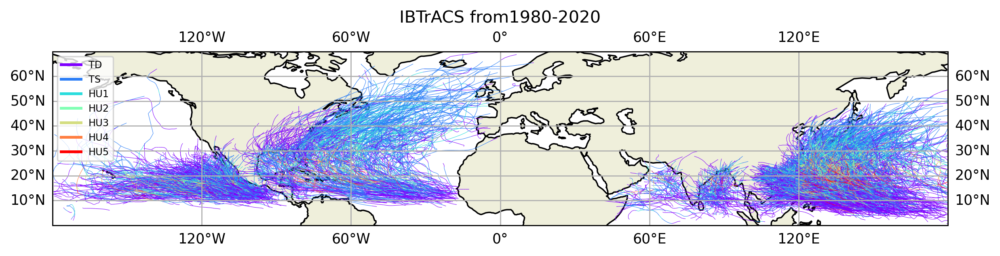

CPU times: user 25.5 s, sys: 132 ms, total: 25.6 s
Wall time: 27.1 s


In [14]:
%%time
# reference
#https://github.com/CLIMADA-project/climada_python/blob/main/climada/hazard/tc_tracks.py

flnm_ib = '/glade/work/mingge/TC_DBS/IBTrACS.ALL.v04r00.nc'
ds = xr.open_dataset(flnm_ib)

lat = ds.usa_lat
lon = ds.usa_lon
wind10 = ds.usa_wind.data
stormYear = ds.season.data  # year based on season
number = ds.number.data
basin = ds.basin.data
basin1 = basin[:,0]
tracktype = ds.track_type.data

tcmask = np.where((stormYear >= year_s) &(stormYear <= year_e))

latselect = lat[tcmask]
lonselect = lon[tcmask]
spdselect = wind10[tcmask]
numberselect = number[tcmask]

plt.figure(figsize=(10, 3), dpi=dpi)

ax = plt.axes(projection=proj)
ax.coastlines()
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
# West Pacific
ax.set_extent(extent)
ax.add_feature(cfeature.OCEAN, facecolor='white')
ax.set_title('IBTrACS from' + str(year_s) + '-' + str(year_e))
ax.add_feature(cfeature.LAND, edgecolor='white')

print('There are: ' + str(len(numberselect)) + ' tracks')

for ii in range(len(numberselect)):
    # use 10m wind speed get rid of nan
    spd_all = np.array(spdselect[ii,:])
    spd_1d  = spd_all[~np.isnan(spd_all)]
    
    lat_1d = np.array(latselect[ii,:])
    lat_1d = lat_1d[~np.isnan(spd_all)]
    
    lon_1d = np.array(lonselect[ii,:]) 
    lon_1d = lon_1d[~np.isnan(spd_all)]
    lon_1d = lon_1d - lon_cen
      
    if len(lon_1d)>0:
        if (lon_1d.max() - lon_1d.min()) >180:
            #discontinue at longitude 0
            lon_1d =np.where(lon_1d < 0, lon_1d+360, lon_1d)
         
        lonlat = np.stack([lon_1d, lat_1d], axis=-1)
        segments = np.stack([lonlat[:-1], lonlat[1:]], axis=1)

        line_collection = LineCollection(segments, cmap=cmap, norm=norm, 
                                         linewidths=.3, linestyle='-')
        # Set the value array from spd_1d, The values that are mapped to colors.
        line_collection.set_array(spd_1d)
 
        ax.add_collection(line_collection)    
        
# for legend
leg_lines = [Line2D([0], [0], color=CAT_COLORS[i_col], lw=2)
                for i_col in range(len(SAFFIR_SIM_CAT))]
leg_names = [CAT_NAMES[i_col] for i_col in sorted(CAT_NAMES.keys())]
# 'upper left':2
ax.legend(leg_lines, leg_names, loc=2, fontsize = 'x-small')
plt.tight_layout()        
  
flnm_p = dir_plot + 'ibtracs_color_' + str(year_s) + '-' + str(year_e) + '_NH.pdf'
print(flnm_p)
plt.savefig(flnm_p)  
plt.show()
      

#### 1.2 IBTrACS track density

/glade/campaign/mmm/c3we/mingge/TC/PLOT/ibtracs_density_1980-2020_NH.pdf


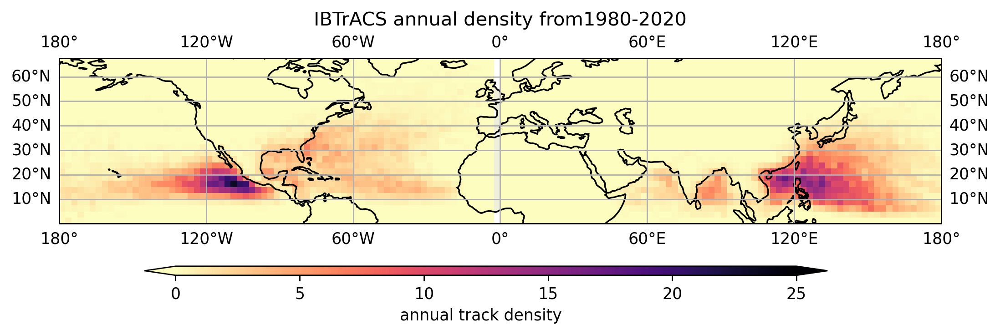

In [15]:
plt.figure(figsize=(10, 4), dpi=dpi)
 
ax = plt.axes(projection=proj)
ax.coastlines()
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
 
ax.add_feature(cfeature.OCEAN, facecolor='white')
ax.set_title('IBTrACS annual density from' + str(year_s) + '-' + str(year_e))
ax.add_feature(cfeature.LAND, edgecolor='white')
bins = (np.arange(0, 70, 2.5 ), np.arange(0, 360, 2.5))

is_first = True
for ii in range(len(numberselect)):
    # use 10m wind speed get rid of nan
    spd_all = np.array(spdselect[ii,:])
    spd_1d  = spd_all[~np.isnan(spd_all)]
    
    lat_1d = np.array(latselect[ii,:])
    lat_1d = lat_1d[~np.isnan(spd_all)]
    
    lon_1d = np.array(lonselect[ii,:]) 
    lon_1d = lon_1d[~np.isnan(spd_all)]
    #lon_1d = lon_1d - lon_cen
    
    
    if len(lon_1d)>0:
        #if (lon_1d.max() - lon_1d.min()) >180:
        # discontinue at longitude 0
        lon_1d =np.where(lon_1d < 0, lon_1d+360, lon_1d) 
        if is_first == True:
            lat_total = lat_1d
            lon_total = lon_1d
            is_first = False
        else:
            lat_total =np.append(lat_total,lat_1d)
            lon_total = np.append(lon_total,lon_1d)
            
density, xedges, yedges = np.histogram2d(np.array(lat_total), np.array(lon_total), 
                                         bins= bins)
xx = xedges   
yy = yedges  
xx, yy = np.meshgrid(xx, yy)
cs = plt.pcolormesh(yy, xx, density.T/float(n_year),
    transform=ccrs.PlateCarree(), cmap="magma_r",
    vmin=0, vmax=25)

#plt.title('IBTrACS density ' + str(year_s) + '-' + str(year_e))
CbarAx = plt.axes([0.2, 0.2, 0.6, 0.02])
cb = plt.colorbar(
    cs, orientation="horizontal", extend="both", cax=CbarAx,
)  
cb.set_label("annual track density  ")  # , fontsize=12)
flnm_p = dir_plot + 'ibtracs_density_' + str(year_s) + '-' + str(year_e) + '_NH.pdf'
print(flnm_p)
plt.savefig(flnm_p)  
plt.show()


### 2.1 CESM-HR 10 member

/glade/campaign/mmm/c3we/mingge/TC/PLOT/track_CESM-HR_1980-2020_NH.pdf


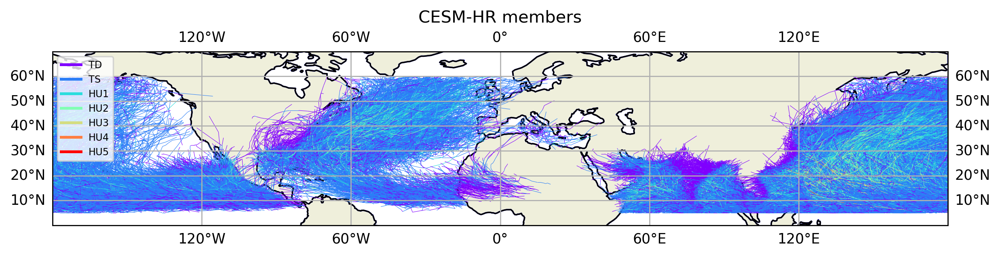

CPU times: user 1min 47s, sys: 406 ms, total: 1min 47s
Wall time: 1min 56s


In [16]:
%%time
dirs = [ff for ff in sorted(glob.glob(dir_hr + "*"))]
 
plt.figure(figsize=(10, 3), dpi=dpi)

ax = plt.axes(projection=proj)
ax.coastlines()
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)

ax.set_extent(extent) 
ax.add_feature(cfeature.OCEAN, facecolor='white')
ax.add_feature(cfeature.LAND, edgecolor='b')
ax.set_title('CESM-HR members')
        
for dir in dirs:
    for year in range(year_s, year_e + 1):
        name = dir[len(dir_hr) + 8:-4]      
        flnm = dir + '/' + 'CESM_HR_TC_'+ name+'_output_' + str(year) + '_NH.txt'
        #print(flnm)  
        df_tc = pd.read_csv(flnm, delimiter=', ', engine='python')
        df = df_tc.loc[df_tc['year'].astype(int) == year]
        tc_ids = np.unique(df.track_id.astype(int))
        
        for tc_id in tc_ids:
            df_single = df.loc[df.track_id.astype(int) == tc_id]
             
            lat_1d = df_single.lat.values.astype(float) 
            lon_1d = df_single.lon.values.astype(float) 
            spd_1d = df_single.wind10.values.astype(float)/kt2ms 
            
            # discontinue at 180
            lon_1d =np.where(lon_1d > 180, lon_1d-360, lon_1d)

            lonlat = np.stack([lon_1d, lat_1d], axis=-1)
            segments = np.stack([lonlat[:-1], lonlat[1:]], axis=1)
            #https://github.com/CLIMADA-project/climada_python/blob/main/climada/hazard/tc_tracks.py
            # Truncate segments which cross the antimeridian.
            mask = (segments[:, 0, 0] > 100) & (segments[:, 1, 0] < -100)
            segments[mask, 1, 0] = 180
            mask = (segments[:, 0, 0] < -100) & (segments[:, 1, 0] > 100)
            segments[mask, 1, 0] = -180
            
            line_collection = LineCollection(segments, cmap=cmap, norm=norm, 
                                         linewidths=.3, linestyle='-')
            # Set the value array from spd_1d, The values that are mapped to colors.
            line_collection.set_array(spd_1d)
            ax.add_collection(line_collection) 

# for legend
leg_lines = [Line2D([0], [0], color=CAT_COLORS[i_col], lw=2)
                for i_col in range(len(SAFFIR_SIM_CAT))]
leg_names = [CAT_NAMES[i_col] for i_col in sorted(CAT_NAMES.keys())]

ax.legend(leg_lines, leg_names, loc=2, fontsize='x-small')
plt.tight_layout()

flnm_p = dir_plot + 'track_CESM-HR_' + str(year_s) + '-' + str(year_e) + '_NH.pdf'
print(flnm_p)
plt.savefig(flnm_p)  
plt.show()     

#### 2.2 CESM-HR 10 member track density

/glade/campaign/mmm/c3we/mingge/TC/PLOT/track_CESM-HR_annual_density_1980-2020_NH.pdf


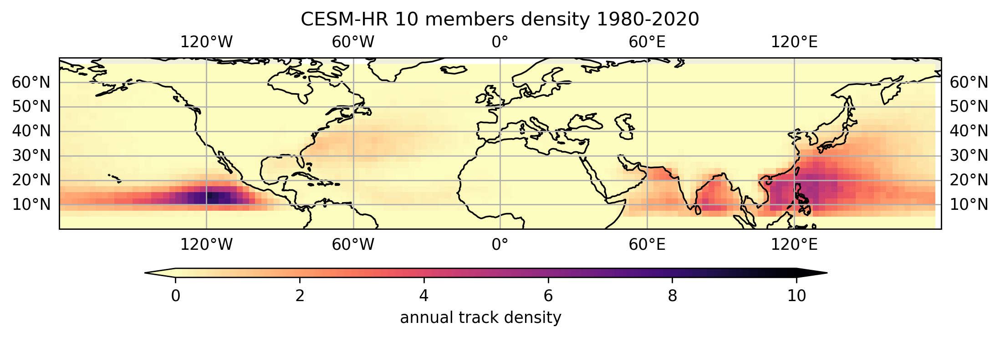

CPU times: user 43.4 s, sys: 148 ms, total: 43.5 s
Wall time: 46.2 s


In [17]:
%%time
dirs = [ff for ff in sorted(glob.glob(dir_hr + "*"))]
 
plt.figure(figsize=(10, 4), dpi=dpi)

ax = plt.axes(projection=proj)
ax.coastlines()
ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
 
ax.set_extent(extent)
ax.set_ylim(lat_s, lat_e) 
ax.add_feature(cfeature.OCEAN, facecolor='white')
ax.add_feature(cfeature.LAND, edgecolor='white')
bins = (np.arange(lat_s, lat_e, 2.5), np.arange(lon_s, lon_e, 2.5))
is_first = True
for dir in dirs:
    for year in range(year_s, year_e + 1):
        name = dir[len(dir_hr) + 8:-4]      
        flnm = dir + '/' + 'CESM_HR_TC_'+ name+'_output_' + str(year) + '_NH.txt'
        #print(flnm)  
        df_tc = pd.read_csv(flnm, delimiter=', ', engine='python')
        # drop rows containing 'year' in column year
        #df_tc = df_tc[~df_tc.year.str.contains("year")]
        
        df = df_tc.loc[df_tc['year'].astype(int) == year]
        tc_ids = np.unique(df.track_id.astype(int))
        
        for tc_id in tc_ids:
            df_single = df.loc[df.track_id.astype(int) == tc_id]
            #spd_1d = df_single.wind10.values.astype(float)*ms2kt
            lat_1d = df_single.lat.values.astype(float) 
            lon_1d = df_single.lon.values.astype(float)             
            lon_1d =np.where(lon_1d > 180, lon_1d-360, lon_1d)

            if is_first == True:
                lat_total = lat_1d
                lon_total = lon_1d
                is_first = False
            else:
                lat_total = np.append(lat_total,lat_1d)
                lon_total = np.append(lon_total,lon_1d)
            
density, xedges, yedges = np.histogram2d(np.array(lat_total), np.array(lon_total), 
                                         bins=bins)
xx = xedges   
yy = yedges  
xx, yy = np.meshgrid(xx, yy)
cs = plt.pcolormesh(yy, xx, 0.1*density.T/float(n_year),
    transform=ccrs.PlateCarree(), cmap="magma_r",
    vmin=0, vmax=10)

plt.title('CESM-HR 10 members density ' + str(year_s) + '-' + str(year_e))
CbarAx = plt.axes([0.2, 0.2, 0.6, 0.02])
cb = plt.colorbar( cs, orientation="horizontal", extend="both", cax=CbarAx)  
cb.set_label("annual track density  ")  # , fontsize=12)

flnm_p = dir_plot + 'track_CESM-HR_annual_density_' + str(year_s) + '-' + str(year_e) + '_NH.pdf'
print(flnm_p)
plt.savefig(flnm_p)  
plt.show()  


#### 3.1 Tracks for each member

/glade/campaign/mmm/c3we/mingge/TC/PLOT/E01_color_1980-2020_NH.pdf


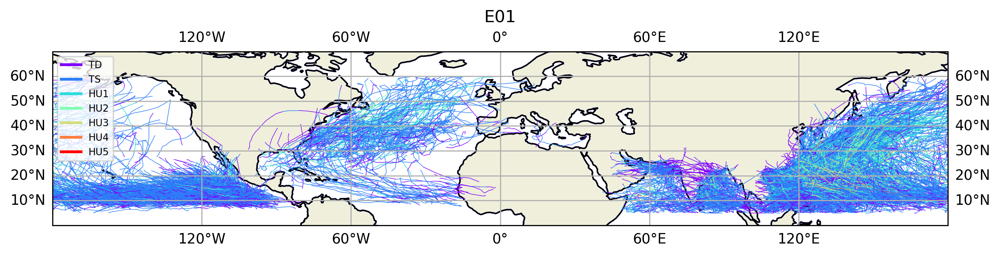

/glade/campaign/mmm/c3we/mingge/TC/PLOT/E02_color_1980-2020_NH.pdf


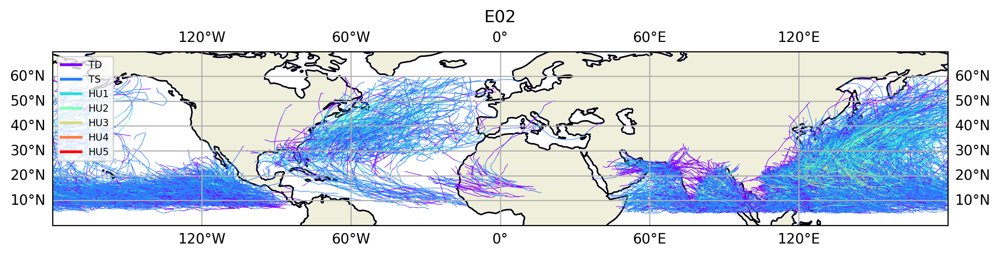

/glade/campaign/mmm/c3we/mingge/TC/PLOT/E03_color_1980-2020_NH.pdf


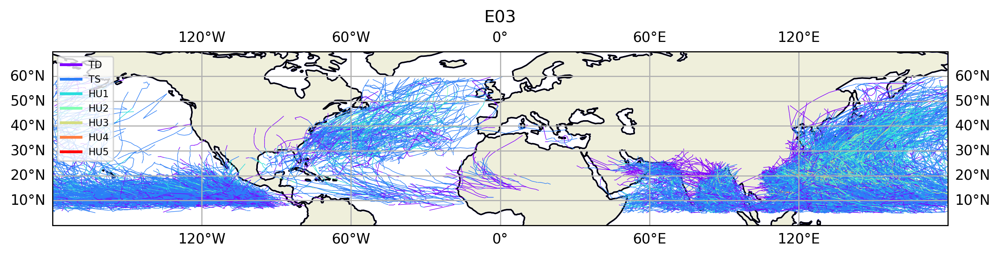

/glade/campaign/mmm/c3we/mingge/TC/PLOT/E04_color_1980-2020_NH.pdf


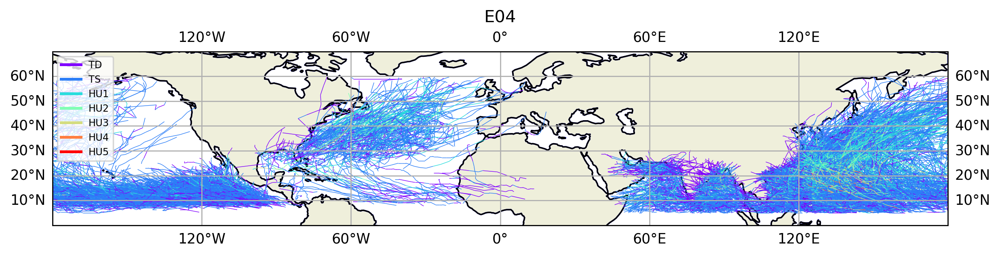

/glade/campaign/mmm/c3we/mingge/TC/PLOT/E05_color_1980-2020_NH.pdf


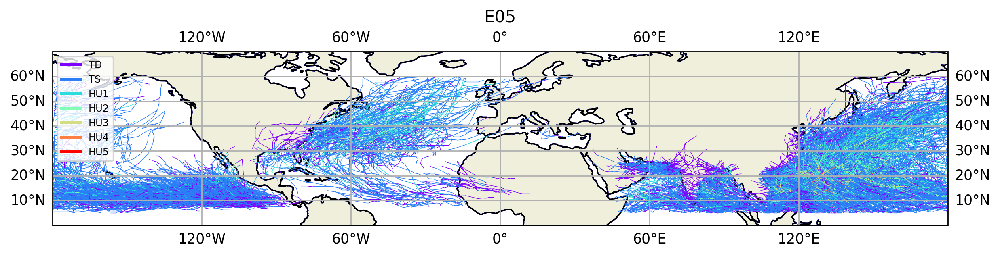

/glade/campaign/mmm/c3we/mingge/TC/PLOT/E06_color_1980-2020_NH.pdf


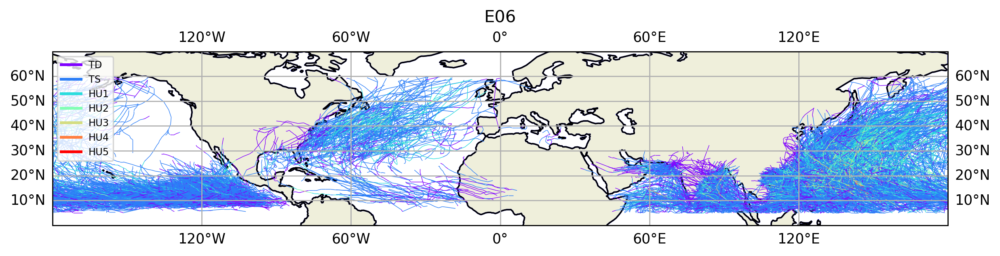

/glade/campaign/mmm/c3we/mingge/TC/PLOT/E07_color_1980-2020_NH.pdf


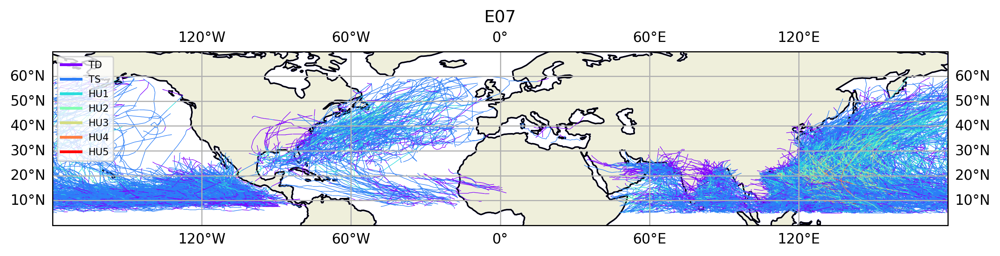

/glade/campaign/mmm/c3we/mingge/TC/PLOT/E08_color_1980-2020_NH.pdf


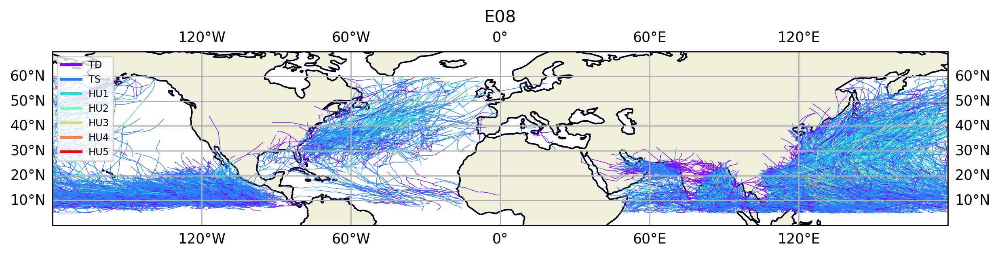

/glade/campaign/mmm/c3we/mingge/TC/PLOT/E09_color_1980-2020_NH.pdf


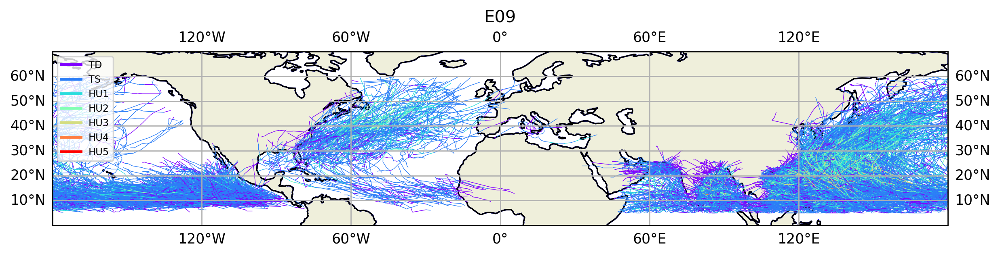

/glade/campaign/mmm/c3we/mingge/TC/PLOT/E10_color_1980-2020_NH.pdf


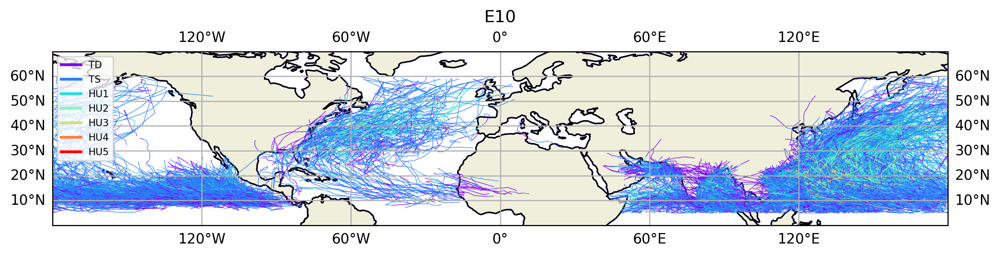

CPU times: user 1min 53s, sys: 343 ms, total: 1min 54s
Wall time: 2min 1s


In [18]:
%%time
dirs = [ff for ff in sorted(glob.glob(dir_hr + "*"))]

for dir in dirs:
    plt.figure(figsize=(10, 3), dpi=dpi)
    ax = plt.axes(projection=ccrs.PlateCarree())
    ax.coastlines()
    ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
    #North Atlantic 
    ax.set_extent(extent)
    ax.add_feature(cfeature.OCEAN, facecolor='white')
    ax.add_feature(cfeature.LAND, edgecolor='b')
    ax.set_title(dir[len(dir_hr) + 8:-4]  )
       
    for year in range(year_s, year_e + 1):
        name = dir[len(dir_hr) + 8:-4]       
        flnm = dir + '/' + 'CESM_HR_TC_'+ name+'_output_' + str(year) + '_NH.txt'
        #print(flnm)  
        df_tc = pd.read_csv(flnm, delimiter=', ', engine='python')
        df = df_tc.loc[df_tc['year'].astype(int) == year]
        tc_ids = np.unique(df.track_id.astype(int))
        
        for tc_id in tc_ids:
            df_single = df.loc[df.track_id.astype(int) == tc_id]
             
            lat_1d = df_single.lat.values.astype(float) 
            lon_1d = df_single.lon.values.astype(float) 
            spd_1d = df_single.wind10.values.astype(float)/kt2ms  
            
            # discontinue at 180
            lon_1d =np.where(lon_1d > 180, lon_1d-360, lon_1d)
            
            lonlat = np.stack([lon_1d, lat_1d], axis=-1)
            segments = np.stack([lonlat[:-1], lonlat[1:]], axis=1)
            #https://github.com/CLIMADA-project/climada_python/blob/main/climada/hazard/tc_tracks.py
            # Truncate segments which cross the antimeridian.
            mask = (segments[:, 0, 0] > 100) & (segments[:, 1, 0] < -100)
            segments[mask, 1, 0] = 180
            mask = (segments[:, 0, 0] < -100) & (segments[:, 1, 0] > 100)
            segments[mask, 1, 0] = -180
            
            line_collection = LineCollection(segments, cmap=cmap, norm=norm, 
                                         linewidths=.4, linestyle='-')
            # Set the value array from spd_1d, The values that are mapped to colors.
            line_collection.set_array(spd_1d)
            ax.add_collection(line_collection) 
            
    # for legend
    leg_lines = [Line2D([0], [0], color=CAT_COLORS[i_col], lw=2)
                for i_col in range(len(SAFFIR_SIM_CAT))]
    leg_names = [CAT_NAMES[i_col] for i_col in sorted(CAT_NAMES.keys())]

    ax.legend(leg_lines, leg_names, loc=2, fontsize='x-small')
    plt.tight_layout()        
    flnm_p = dir_plot + name + '_color_' + str(year_s) + '-' + str(year_e) + '_NH.pdf'
    print(flnm_p)
    plt.savefig(flnm_p)  
    plt.show()  
    

#### 3.2 Track density for each CESM-HR member

/glade/campaign/mmm/c3we/mingge/TC/PLOT/CESM_HR_TC_E10_output_2020_NH_track_annual_density_1980-2020_NH.pdf


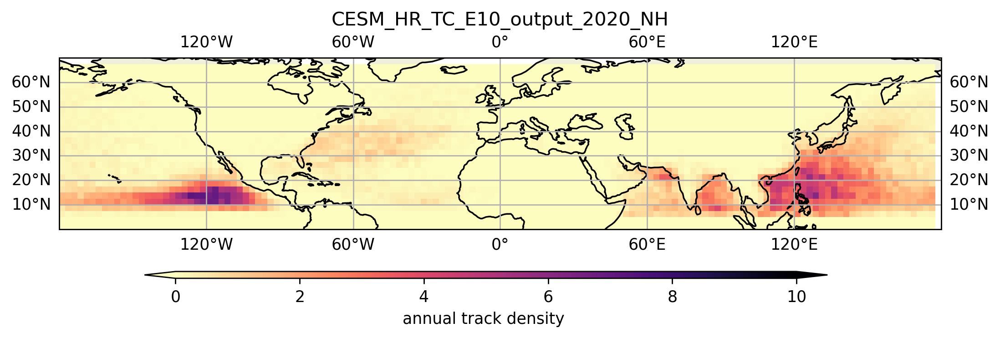

/glade/campaign/mmm/c3we/mingge/TC/PLOT/CESM_HR_TC_E01_output_2020_NH_track_annual_density_1980-2020_NH.pdf


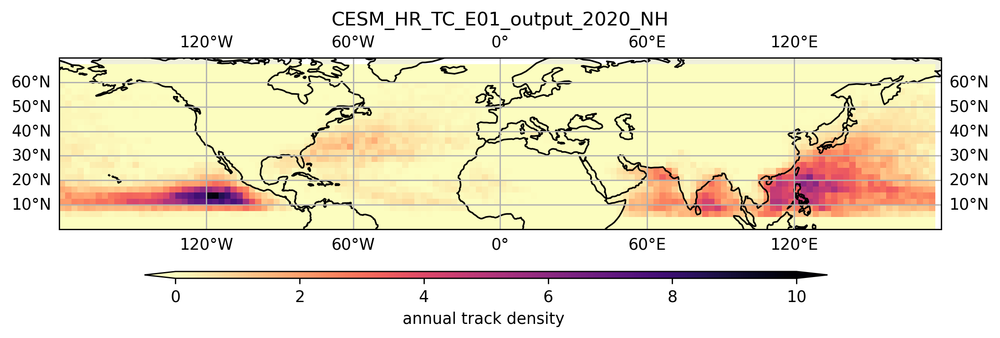

/glade/campaign/mmm/c3we/mingge/TC/PLOT/CESM_HR_TC_E02_output_2020_NH_track_annual_density_1980-2020_NH.pdf


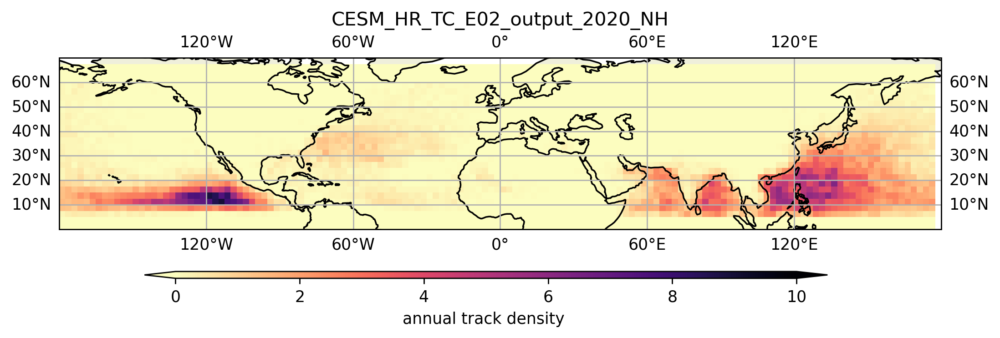

/glade/campaign/mmm/c3we/mingge/TC/PLOT/CESM_HR_TC_E03_output_2020_NH_track_annual_density_1980-2020_NH.pdf


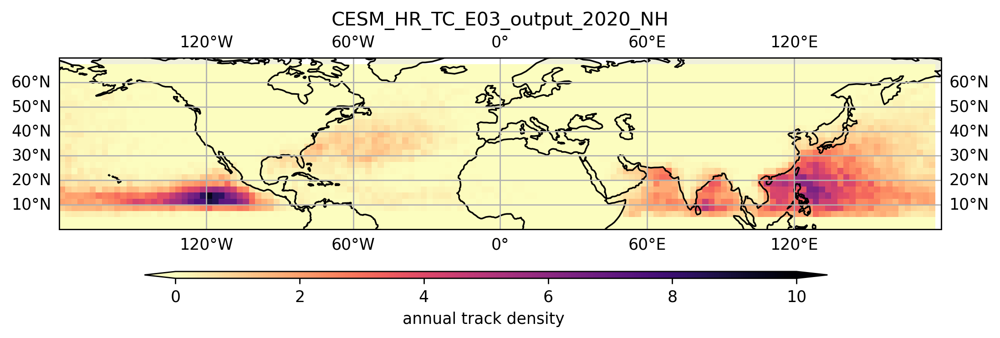

/glade/campaign/mmm/c3we/mingge/TC/PLOT/CESM_HR_TC_E04_output_2020_NH_track_annual_density_1980-2020_NH.pdf


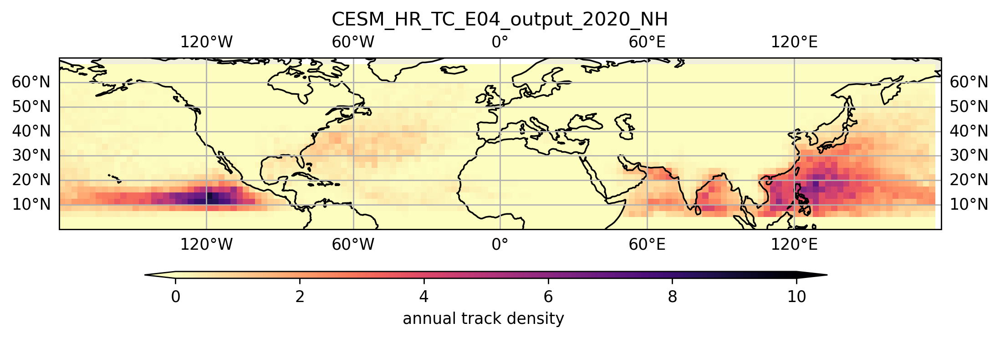

/glade/campaign/mmm/c3we/mingge/TC/PLOT/CESM_HR_TC_E05_output_2020_NH_track_annual_density_1980-2020_NH.pdf


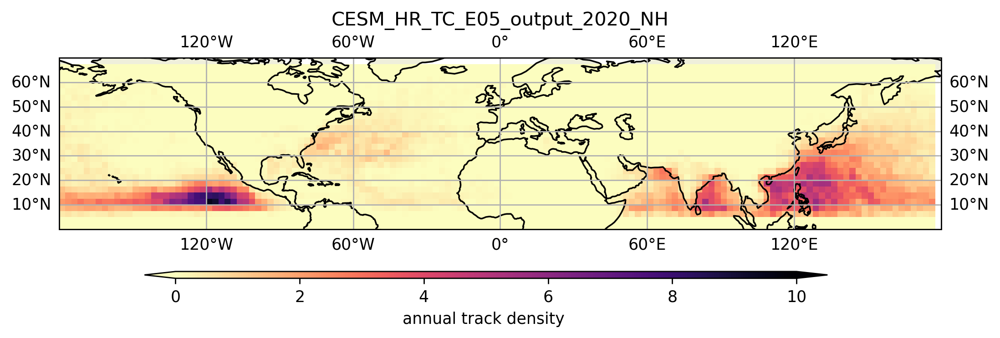

/glade/campaign/mmm/c3we/mingge/TC/PLOT/CESM_HR_TC_E06_output_2020_NH_track_annual_density_1980-2020_NH.pdf


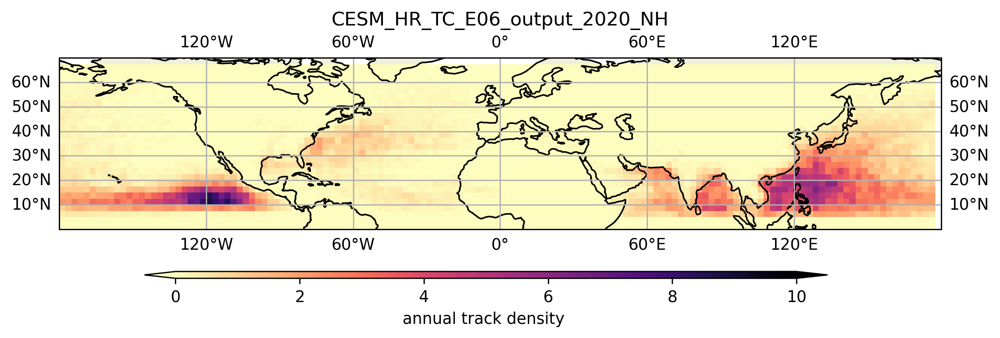

/glade/campaign/mmm/c3we/mingge/TC/PLOT/CESM_HR_TC_E07_output_2020_NH_track_annual_density_1980-2020_NH.pdf


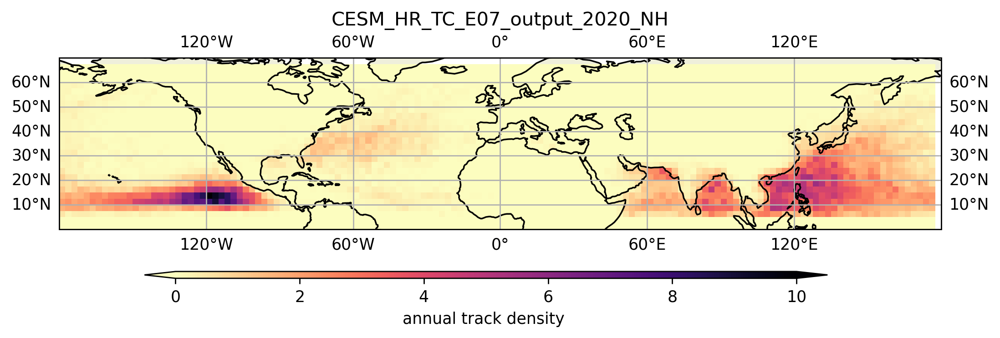

/glade/campaign/mmm/c3we/mingge/TC/PLOT/CESM_HR_TC_E08_output_2020_NH_track_annual_density_1980-2020_NH.pdf


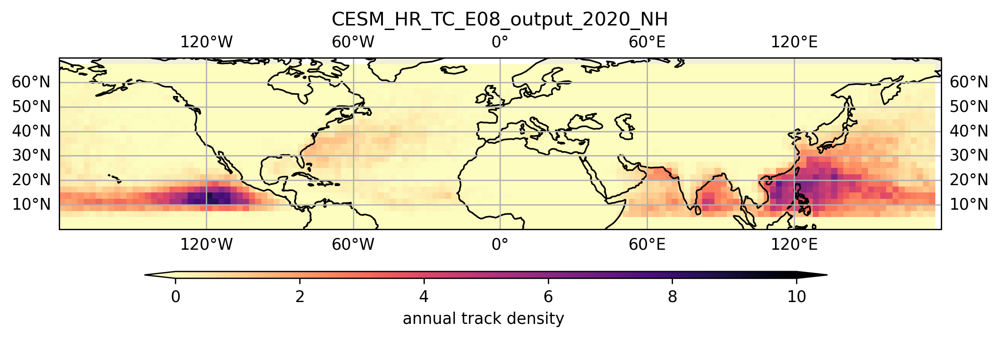

/glade/campaign/mmm/c3we/mingge/TC/PLOT/CESM_HR_TC_E09_output_2020_NH_track_annual_density_1980-2020_NH.pdf


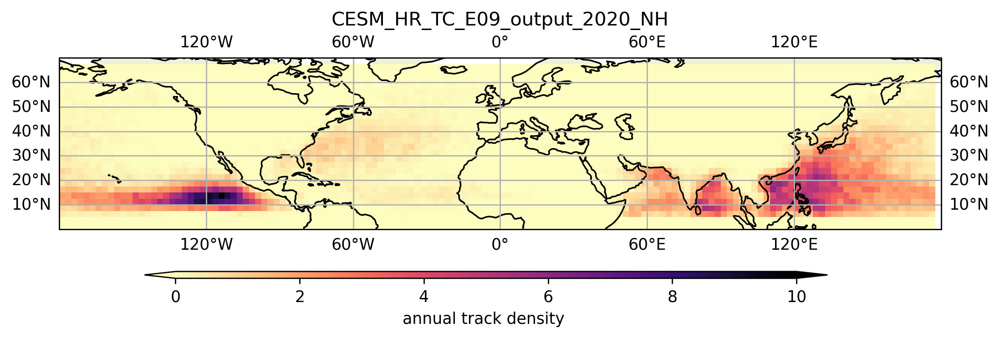

CPU times: user 22.2 s, sys: 88.3 ms, total: 22.3 s
Wall time: 24.4 s


In [20]:
%%time
dirs = [ff for ff in sorted(glob.glob(dir_hr + "*"))]
 
bins = (np.arange(lat_s, lat_e, 2.5), np.arange(lon_s, lon_e, 2.5))

is_first = True
for dir in dirs:
    is_first = True
    plt.figure(figsize=(10, 3), dpi=dpi)
    ax = plt.axes(projection=proj)
    ax.coastlines()
    ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False)
 
    ax.set_extent(extent)
    ax.set_ylim(lat_s, lat_e)
    ax.add_feature(cfeature.OCEAN, facecolor='white')
    ax.add_feature(cfeature.LAND, edgecolor='white')
    title_s = flnm[len(dir_data)+13:-4]
    ax.set_title(title_s)

    for year in range(year_s, year_e + 1):
        name = dir[len(dir_hr) + 8:-4]      
        flnm = dir + '/' + 'CESM_HR_TC_'+ name+'_output_' + str(year) + '_NH.txt'
        #print(flnm)  
        df_tc = pd.read_csv(flnm, delimiter=', ', engine='python')
        df = df_tc.loc[df_tc['year'].astype(int) == year]
        tc_ids = np.unique(df.track_id.astype(int))
        # 29
        for tc_id in tc_ids:
            df_single = df.loc[df.track_id.astype(int) == tc_id]
            spd_1d = df_single.wind10.values.astype(float)*ms2kt
            lat_1d = df_single.lat.values.astype(float) 
            lon_1d = df_single.lon.values.astype(float)             
            lon_1d =np.where(lon_1d > 180, lon_1d-360, lon_1d)

            if is_first == True:
                lat_total = lat_1d
                lon_total = lon_1d
                is_first = False
            else:
                lat_total =np.append(lat_total,lat_1d)
                lon_total = np.append(lon_total,lon_1d)
            
    density, xedges, yedges = np.histogram2d(np.array(lat_total), np.array(lon_total), 
                                         bins=bins)
    xx = xedges   
    yy = yedges  
    xx, yy = np.meshgrid(xx, yy)
    cs = plt.pcolormesh(yy, xx, density.T/float(n_year),
        transform=ccrs.PlateCarree(), cmap="magma_r",
        vmin=0, vmax=10)
    
    CbarAx = plt.axes([0.2, 0.1, 0.6, 0.02])
    cb = plt.colorbar(
    cs, orientation="horizontal", extend="both", cax=CbarAx)  
    cb.set_label(" annual track density  ")  # , fontsize=12)
    flnm_p = dir_plot + title_s + '_track_annual_density_' + str(year_s) + '-' + str(year_e) + '_NH.pdf'
    print(flnm_p)
    plt.savefig(flnm_p)  
    plt.show()
